In [832]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [833]:
train=pd.read_excel("Final_Train.xlsx")
test=pd.read_excel("Final_Test.xlsx")

In [834]:
train.head()

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees
0,"BHMS, MD - Homeopathy",24 years experience,100%,"Kakkanad, Ernakulam",Homeopath,"100% 16 Feedback Kakkanad, Ernakulam",100
1,"BAMS, MD - Ayurveda Medicine",12 years experience,98%,"Whitefield, Bangalore",Ayurveda,"98% 76 Feedback Whitefield, Bangalore",350
2,"MBBS, MS - Otorhinolaryngology",9 years experience,NaN,"Mathikere - BEL, Bangalore",ENT Specialist,NaN,300
3,"BSc - Zoology, BAMS",12 years experience,NaN,"Bannerghatta Road, Bangalore",Ayurveda,"Bannerghatta Road, Bangalore ₹250 Available on...",250
4,BAMS,20 years experience,100%,"Keelkattalai, Chennai",Ayurveda,"100% 4 Feedback Keelkattalai, Chennai",250


In [835]:
train.shape

(5961, 7)

 train dataset contins 5961 rows and 7 columns

In [836]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5961 entries, 0 to 5960
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Qualification       5961 non-null   object
 1   Experience          5961 non-null   object
 2   Rating              2659 non-null   object
 3   Place               5936 non-null   object
 4   Profile             5961 non-null   object
 5   Miscellaneous_Info  3341 non-null   object
 6   Fees                5961 non-null   int64 
dtypes: int64(1), object(6)
memory usage: 326.1+ KB


train dta set features are categorical except target feature

In [837]:
train.isnull().sum()

Qualification            0
Experience               0
Rating                3302
Place                   25
Profile                  0
Miscellaneous_Info    2620
Fees                     0
dtype: int64

there are  3302 null values in rating feature,
25 null values in place
2620 null values in miscallaneous_info feature

In [838]:
train.describe()

,Fees
count,5961.000000
mean,307.944640
std,190.920373
min,5.000000
25%,150.000000
50%,300.000000
75%,500.000000
max,950.000000


Minimum fees charged by a doctor in this data set is 5 and the maximum is 950, there are outliers in the target feature

let crate some more columns in the data framme to evaluate experience and rating

In [839]:
#creating a new column with number of yrs of experience

yr_exp=[]
for i in train['Experience']:
    yr_exp_spl=i.split(' ')
    yr_exp.append(yr_exp_spl[0])

train['yr_exp']=yr_exp
train['yr_exp']=train['yr_exp'].astype(int)

In [840]:
train.head()

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees,yr_exp
0,"BHMS, MD - Homeopathy",24 years experience,100%,"Kakkanad, Ernakulam",Homeopath,"100% 16 Feedback Kakkanad, Ernakulam",100,24
1,"BAMS, MD - Ayurveda Medicine",12 years experience,98%,"Whitefield, Bangalore",Ayurveda,"98% 76 Feedback Whitefield, Bangalore",350,12
2,"MBBS, MS - Otorhinolaryngology",9 years experience,NaN,"Mathikere - BEL, Bangalore",ENT Specialist,NaN,300,9
3,"BSc - Zoology, BAMS",12 years experience,NaN,"Bannerghatta Road, Bangalore",Ayurveda,"Bannerghatta Road, Bangalore ₹250 Available on...",250,12
4,BAMS,20 years experience,100%,"Keelkattalai, Chennai",Ayurveda,"100% 4 Feedback Keelkattalai, Chennai",250,20


In [841]:
train.describe()

,Fees,yr_exp
count,5961.000000,5961.000000
mean,307.944640,17.303976
std,190.920373,11.142798
min,5.000000,0.000000
25%,150.000000,9.000000
50%,300.000000,14.000000
75%,500.000000,23.000000
max,950.000000,66.000000


In [842]:
train['Rating'].unique()

array(['100%', '98%', nan, '99%', '79%', '95%', '97%', '94%', '88%',
       '90%', '80%', '93%', '36%', '78%', '87%', '96%', '82%', '89%',
       '74%', '86%', '92%', '83%', '76%', '85%', '56%', '91%', '68%',
       '60%', '75%', '69%', '73%', '67%', '77%', '33%', '55%', '71%',
       '84%', '45%', '63%', '72%', '81%', '62%', '57%', '7%', '48%',
       '40%', '70%', '64%', '65%', '47%', '58%', '53%'], dtype=object)

Average rating are from 36% to 100% which has 3302 NaN values, lets explore this featur befor  dropping it

# EDA

# Univariate Analysis

In [843]:
train['Qualification'].value_counts()

BDS                                                                                                                                                                                                                                                                                                                                                                          488
BHMS                                                                                                                                                                                                                                                                                                                                                                         477
BAMS                                                                                                                                                                                                                                                                  

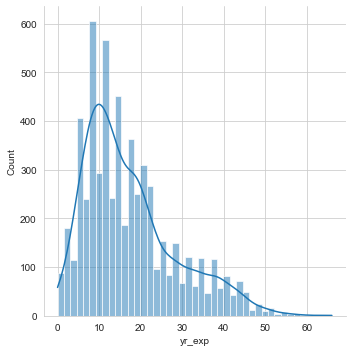

In [844]:
sns.displot(train['yr_exp'],kde=True)

Years of experience is little skewed to teh right due to high number of experience

C:\Users\suren\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='Rating', ylabel='count'>

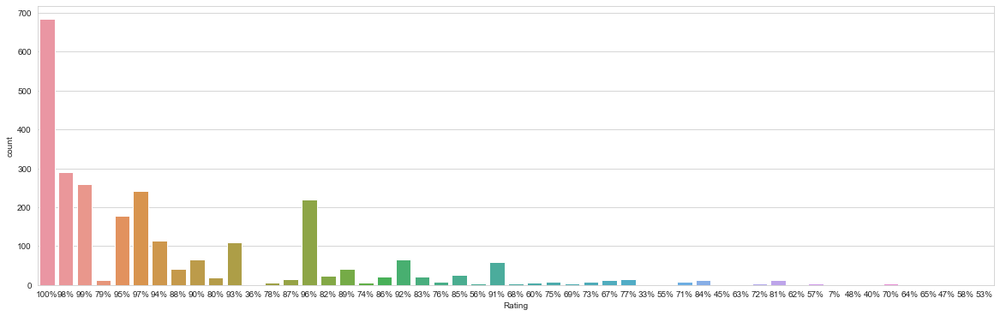

In [845]:
plt.figure(figsize=(20,6))
sns.countplot(train['Rating'])

Theree are nearly 700 doctors whose average rating is 100%.
many doctors average rating is between 100 to 95%.

In [846]:
train['Rating']=train['Rating'].replace(np.NaN,train['Rating'].mode()[0])

C:\Users\suren\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='Rating', ylabel='count'>

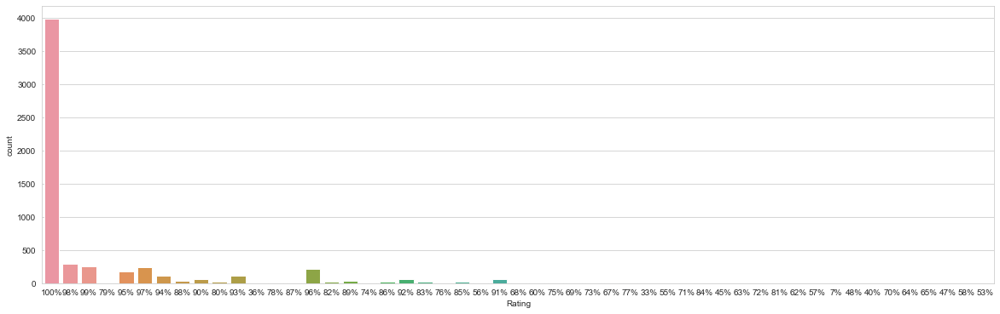

In [847]:
plt.figure(figsize=(20,6))
sns.countplot(train['Rating'])

C:\Users\suren\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='Place', ylabel='count'>

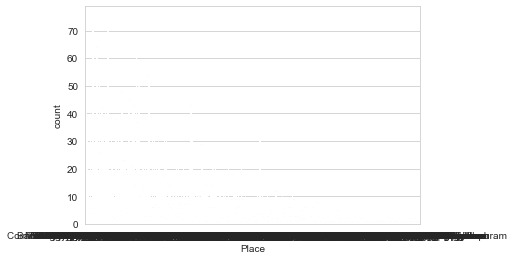

In [848]:
sns.countplot(train['Place'])

since the the locality and city are in the same feature lets seperate them and explorethe data then we will group them and see.

In [849]:
train['City'] = list(train['Place'].str.split(',').str[1])
train['Locality'] = list(train['Place'].str.split(',').str[0])

C:\Users\suren\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='City', ylabel='count'>

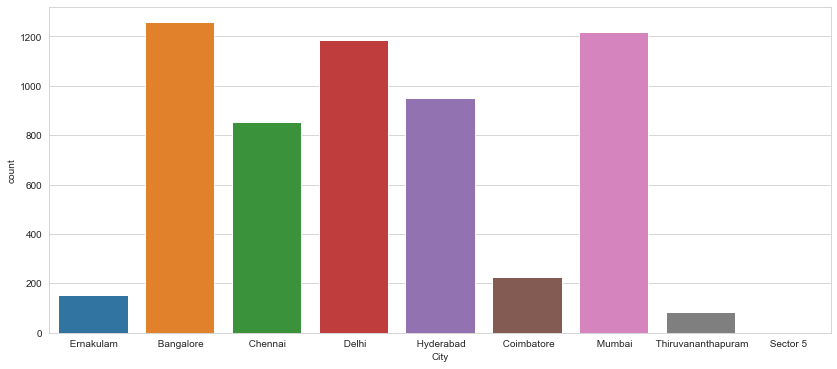

In [850]:
plt.figure(figsize=(14,6))
sns.countplot(train['City'])

high data range in the given data set are from Bangalore, Chennai,Delhi,Hyderabad and Mumbai

In [851]:
ban_hos=train[train['City'].str.strip()=='Bangalore']
ban_hos['Locality'].unique()

array(['Whitefield', 'Mathikere - BEL', 'Bannerghatta Road', 'Arekere',
       'HSR Layout', 'RT Nagar', 'Yelahanka New Town', 'Malleswaram',
       'Jayanagar', 'Kanakpura Road', 'Koramangala', 'Bommanahalli',
       'Yelahanka', 'Indiranagar', 'BTM Layout 2nd Stage',
       'Banashankari 3rd Stage', 'Kumaraswamy Layout', 'Yeshwanthpur',
       'Basaveshwaranagar', 'Rajajinagar', 'Wilson Garden', 'Nagarbhavi',
       'Vijayanagar', 'Koramangala 1 Block', 'CV Raman Nagar',
       'BTM Layout 1st Stage', 'Banashankari', 'Kalyan Nagar',
       'Electronics City', 'Basavanagudi', 'MG Road', 'Bilekahalli',
       'Bellandur', 'Ulsoor', 'Horamavu', 'Kammana Halli', 'Panathur',
       'Rajarajeshwarinagar', 'Jakkur', 'Kumara Park West', 'Domlur',
       'Jeevanbhimanagar', 'Kasavanahalli', 'Kothanur', 'Kadugodi',
       'KR Puram', 'Banaswadi', 'BTM Layout', 'Sahakaranagar',
       'Marathahalli', 'JP Nagar 2 Phase', 'Jayamahal', 'Kundalahalli',
       'Kaggadasapura', 'Mahadevapura', 'JP Na

In [852]:
len(ban_hos['Locality'])

1258

In [853]:
ern_hos=train[train['City'].str.strip()=='Ernakulam']
print(ern_hos['Locality'].unique())
print(len(ern_hos['Locality']))

['Kakkanad' 'Athani' 'Thammanam' 'Kadavanthra' 'Vyttila' 'Kolenchery'
 'Thevara' 'Aluva' 'Kaloor' 'Thrikkakara' 'Paravur' 'Kalady' 'Vennala'
 'Tripunithura' 'Edapally' 'Palarivattom' 'Kochi' 'Cherai' 'Edakochi'
 'Vazhakulam' 'Thoppumpady' 'Ernakulam College' 'Ernakulam North'
 'Banerji Road' 'Pezhakkappilly' 'Panampilly Nagar' 'Muvattupuzha'
 'Pachalam' 'Perumbavoor' 'Koovappady' 'Elamakkara' 'Eroor South'
 'Kalamassery' 'Marine Drive' 'Angamaly' 'Piravom' 'Koothattukulam'
 'Changampuzha Nagar' 'Manjapra' 'Vaduthala' 'Mulanthuruthy'
 'Kothamangalam' 'Palluruthy' 'Edapally North' 'Kakkanad West'
 'Ramamangalam' 'Chullickal' 'Karukappilli' 'Kochi M.G.Road'
 'Puthenvelikkara' 'Nettoor' 'Pattimattam']
153


In [854]:
chn_hos=train[train['City'].str.strip()=='Chennai']
print(chn_hos['Locality'].unique())
print(len(chn_hos['Locality']))

['Keelkattalai' 'Porur' 'Thousand Lights' 'Tambaram West' 'Purasawakkam'
 'Mogappair East' 'Chetpet' 'Kodambakkam' 'Pallikaranai' 'Adambakkam'
 'Ambattur' 'Nungambakkam' 'Anna Nagar East' 'Maduravoyal' 'Greams Road'
 'T Nagar' 'Perumbakkam' 'Nesapakkam' 'Ashok Nagar' 'Thoraipakkam'
 'Vadapalani' 'Ayanavaram' 'Adyar' 'Thiruvanmiyur' 'Alwarpet'
 'Kilkattalai' 'Vanagaram' 'MRC Nagar' 'Mogappair West' 'Villivakkam'
 'Chromepet' 'Pammal' 'Velachery' 'Karapakkam' 'Mylapore' 'Perungudi'
 'Thiruvottiyur' 'Nanganallur' 'Manapakkam' 'Manali' 'Valasaravakkam'
 'OMR Road' 'Mandaveli' 'Chinmaya Nagar' 'Perambur' 'Alwarthirunagar'
 'Tondiarpet' 'Besant Nagar' 'Medavakkam' 'West Mambalam' 'Aminjikarai'
 'Madipakkam' 'Anna Nagar West' 'Raja Annamalai Puram' 'Mount Road'
 'KK Nagar' 'Alandur' 'Kolathur' 'Guduvanchery' 'Kandanchavadi'
 'Rajakilpakkam' 'Mugalivakkam' 'Kilpauk' 'Virugambakkam' 'Tambaram'
 'Guindy' 'Red Hills' 'Park Town' 'Chintadripet' 'Selaiyur' 'Saligramam'
 'Thirumullaivoyal' 'Teynampe

In [855]:
del_hos=train[train['City'].str.strip()=='Delhi']
print(del_hos['Locality'].unique())
print(len(del_hos['Locality']))

['Karol Bagh' 'Kondli' 'Vasundhra Enclave' 'Defence Colony' 'CR Park'
 'IP Extension' 'Safdarjung Enclave' 'New Friends Colony' 'Saket'
 'Paschim Vihar' 'Meera Bagh' 'Chattarpur' 'Punjabi Bagh' 'Shalimar Bagh'
 'Sagarpur' 'Munirka' 'Tuglakabad' 'Green Park' 'Hazrat Nizamuddin'
 'Old Rajendra Nagar' 'Bakkarwala' 'Uttam Nagar' 'Gujranwala Town'
 'Greater Kailash Part 1' 'Panchsheel Park' 'South Extension 2'
 'Pitampura' 'Vikas Puri' 'Krishna Nagar' 'Dwarka' 'Janak Puri'
 'South Extension 1' 'Pahar Ganj' 'Lajpat Nagar' 'Mayur Vihar Ph-I'
 'Dilshad Garden' 'Mayur Vihar Ph-III' 'Ashok Vihar' 'Chanakyapuri'
 'Greater Kailash Part 2' 'Rohini' 'Palam Colony' 'Model Town 3'
 'Hari Nagar' 'Tilak Nagar' 'Preet Vihar' 'Shankar Vihar' 'Jhilmil Colony'
 'Dwarka Sector 7' 'Vasant Vihar' 'Karkardooma' 'Ramesh Nagar'
 'Vasant Kunj' 'Yamuna Vihar' 'Rani Bagh' 'Kailash Colony' 'Pandav Nagar'
 'Adarsh Nagar' 'Mayur Vihar Ph-II' 'Tis Hazari' 'Patel Nagar West'
 'Jagriti Enclave' 'Sarita Vihar' 'Model Town'

In [856]:
hyd_hos=train[train['City'].str.strip()=='Hyderabad']
print(hyd_hos['Locality'].unique())
print(len(hyd_hos['Locality']))

['Old City' 'Somajiguda' 'Jubilee Hills' 'Saroor Nagar' 'KPHB'
 'Kukatpally' 'Banjara Hills' 'Hyder Nagar' 'Basheerbagh' 'Musheerabad'
 'AS Rao Nagar' 'Madhapur' 'Gandhinagar' 'Nallakunta' 'Himayat Nagar'
 'Attapur' 'Lakdikapul' 'Miyapur' 'Moosarambagh' 'Moosapet' 'Shaikpet'
 'Manikonda' 'Kondapur' 'Langer House' 'Chanchalguda' 'Chikkadpally'
 'Dilsukhnagar' 'Begumpet' 'Hitech City' 'Yousufguda' 'Secunderabad'
 'Ramkoti' 'Malkajgiri' 'Gachibowli' 'Srinagar Colony' 'Ameerpet'
 'Barkatpura' 'Borabanda' 'Vanasthalipuram' 'Tolichowki' 'Mehdipatnam'
 'SR Nagar' 'Malakpet' 'Vikrampuri Colony' 'LB Nagar' 'Punjagutta'
 'Karkhana' 'Sun city' 'Alwal' 'Trimulgherry' 'Old Bowenpally'
 'Santosh Nagar' 'West Marredpally' 'Rajendra Nagar' 'Narayanguda'
 'Kothapet' 'Suchitra Circle' 'Vijaynagar Colony' 'Erragadda'
 'Tilak Nagar' 'Sainikpuri' 'Nizampet' 'Padmarao Nagar' 'Uppal'
 'Chanda Nagar' 'Madinaguda' 'Khairatabad' 'Kalyanpuri' 'Ecil' 'Charminar'
 'Baghlingampally' 'Falaknuma' 'Pragathi Nagar' 'Ch

In [857]:
cim_hos=train[train['City'].str.strip()=='Coimbatore']
print(cim_hos['Locality'].unique())
print(len(cim_hos['Locality']))

['Coimbatore Racecourse' 'Pollachi' 'Vadavalli' 'Ramnagar' 'Gandhipuram'
 'Sulur' 'Peelamedu' 'Pasur-avanashi' 'Velandipalayam' 'R.S. Puram'
 'Singanallur' 'Tatabad' 'Sundarapuram' 'Ganapathy' 'Selvapuram'
 'Hope College' 'Thudiyalur' 'Saibaba Colony' 'Nanjundapuram'
 'Sowripalayam' 'Vilankurichi' 'Coimbatore Aerodrome' 'Saravanampatti'
 'Ramanathapuram' 'Siddhapudur' 'Coimbatore Ukkadam' 'Kavundampalayam'
 'Ondipudur' 'Uppilipalayam' 'Coimbatore Central' 'Pappanaickenpalayam'
 'Pappanaickenpudur' 'Venkitapuram' 'Kuniamuthur' 'Kovilpalayam'
 'Vellakinar' 'Kuppakonanpudur' 'Goldwins' 'Kalapatti' 'Rathinapuri'
 'Pappanaickenpalayam West' 'Veerakeralam' 'Podanur' 'Edayarpalayam'
 'Cherannagar' 'Mettupalayam' 'Kovaipudur' 'Malumichampatti']
228


In [858]:
mum_hos=train[train['City'].str.strip()=='Mumbai']
print(mum_hos['Locality'].unique())
print(len(mum_hos['Locality']))

['Chembur' 'Andheri' 'Sion West' 'Borivali West' 'Malad' 'Dahisar West'
 'Powai' 'Vileparle East' 'Andheri West' 'Mahalaxmi' 'Kalina' 'Girgaon'
 'Bandra West' 'Dahisar East' 'Dadar West' 'Khar West' 'Goregaon West'
 'Chandivali' 'Kandivali East' 'Malad West' 'Andheri East' 'Bhandup West'
 'Kemps Corner' 'Kandivali West' 'Wadala' 'Nariman Point' 'Kurla West'
 'Goregaon East' 'Ghatkopar East' 'Mulund West' 'Ghatkopar West' 'Worli'
 'Saki Vihar Road' 'Versova' 'Kurla East' 'Mahim' 'Oshiwara' 'Borivali'
 'Mulund' 'Dadar East' 'Bhayandar West' 'Santacruz East' 'Chembur East'
 'Santacruz West' 'Jogeshwari East' 'Marine Lines' 'Opera House'
 'Vileparle West' 'Nagpada' 'Charkop' 'Dadar' 'Matunga' 'Mira Road'
 'Mulund East' 'Bhayandar East' 'Cuffe Parade' 'Jogeshwari West'
 'Kala Ghoda' 'Vikhroli West' 'Bandra East' 'Malad East' 'Prabhadevi'
 'Borivali East' 'Juhu' 'Bhandup East' 'Jacob Circle' 'Charni Road'
 'Chunabhatti' 'Vikhroli East' 'Govandi' 'Mira Bhayandar' 'Trombay' 'Fort'
 'Mankhurd' 

In [859]:
tir_hos=train[train['City'].str.strip()=='Thiruvananthapuram']
print(tir_hos['Locality'].unique())
print(len(tir_hos['Locality']))

['Pattom' 'Palayam' 'TV Medical College' 'Pappanamcode' 'TVM Beach'
 'Thiruvallom' 'Kumarapuram' 'Ambalamukku' 'Kattakada' 'Ulloor'
 'Balaramapuram' 'Muttada' 'TV Museum' 'Kaudiar Square' 'Karamana'
 'PMG Jn' 'Sreekaryam' 'Manacaud' 'Perurkada' 'Sasthamangalam'
 'Vadasserikonam' 'Thirumala' 'Paruthippara' 'Kazhakuttam' 'Peroor'
 'Kallambalam' 'TV Chalai' 'Cotton Hill' 'Kuravankonam' 'Perumathura'
 'Poojapura' 'TVM Pettah' 'Vanchiyur' 'Kovalam' 'Thonnakkal'
 'Venjaramoodu' 'Vizhinjam' 'Parassala' 'Vallakkadavoo' 'Nellimoodu'
 'Peyad' 'Poovachal' 'Pothencode' 'Palkulangara' 'Neyyattinkara Town'
 'TVM Fort' 'Valiathura' 'Kowdiar']
86


In [860]:
sec5=train[train['City'].str.strip()=='Sector 5']
print(sec5['Locality'].unique())
print(len(sec5['Locality']))

['Dwarka']
1


C:\Users\suren\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='Profile', ylabel='count'>

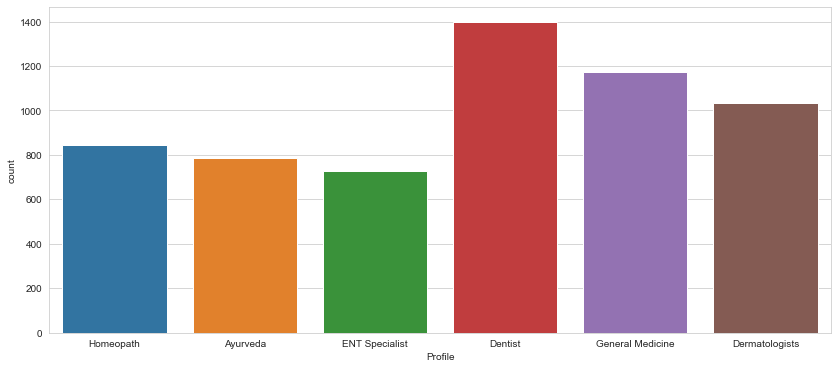

In [861]:
plt.figure(figsize=(14,6))
sns.countplot(train['Profile'])

dentists are high in the give dataset,                        
General Medicine is the second highest                        
Dermatologist is the thist highest.                        
Homeopathy,Ayurveda,ENT specialist are more likely equal in the given data set.

In [862]:
print(len(train['Miscellaneous_Info'].unique()))

2999


there are 2999 different info's are given in the dataset

In [863]:
pd.set_option('display.max_rows', len(train))
train['Miscellaneous_Info']

0                    100% 16 Feedback Kakkanad, Ernakulam
1                   98% 76 Feedback Whitefield, Bangalore
2                                                     NaN
3       Bannerghatta Road, Bangalore ₹250 Available on...
4                   100% 4 Feedback Keelkattalai, Chennai
5                                                     NaN
6                                                     NaN
7       Dental Fillings Crowns and Bridges Fixing Impa...
8                                                     NaN
9                                                     NaN
10                                                    NaN
11                                                    NaN
12      98% 14 Feedback Coimbatore Racecourse, Coimbatore
13          Dental Crowns Facet Dental Dental prophylaxis
14                                                    NaN
15                                                    NaN
16                                                    NaN
17            

# BIVARIATE ANALYSIS

In [864]:
#since qualification feature contains multiple qualifications, lets split them and create new features
max_qua=0
for i in train['Qualification']:
    qual_split=i.split(',')
    if len(qual_split) >max_qua:
        max_qua=len(qual_split)
        print(i,'=============')
print('Maximum no of qualifications of a doctor is : ', max_qua)

BHMS, MD - Homeopathy =============
MBBS, MS, DNB - ENT =============
MBBS, MD - Dermatology , Venereology & Leprosy, FRGUHS, Fellowship in Dermatological Laser Surgery =============
MBBS, Member of the Royal College of Physicians, UK (MRCP UK), DNB, MNAMS- Family Medicine, MD - Medicine =============
BDS, MDS - Oral & Maxillofacial Surgery, Diplomate in Oral Implantology, Masters in Oral Implantology, Implant Externship Program, Fellowship in Implantology, Fellowship in Aesthetic Medicine =============
Diploma in Diet and Nutrition, BHMS, Diploma in Beauty Therapy, Certificate Course In Cosmetic Dermatology & Lasers, PG Diploma In Clinical Cosmetology (PGDCC), PG Diploma in Trichology, Certificate in Botox ,Fillers , Threadlifts =============
Fellowship in Oral implantlogy, Certified Advance Course In Endodontics, Certified in Orthodontics, Certification in Full Mouth Rehabilitation, Certified BPS Dentist, Certificate in Cosmetic Dentistry, Professional Implantology Training Course (P

In [865]:
#Lets see if number of qualification has an impact toward the target variaable
length=[]
for i in train['Qualification']:
    qual_split=i.split(',')
    length.append(len(qual_split))

train['qual_count']=length

In [866]:
train['qual_count']

0        2
1        2
2        2
3        2
4        1
5        1
6        1
7        1
8        2
9        2
10       3
11       1
12       2
13       2
14       3
15       2
16       2
17       2
18       2
19       1
20       3
21       2
22       1
23       2
24       2
25       1
26       2
27       3
28       2
29       2
30       3
31       1
32       2
33       3
34       1
35       3
36       1
37       2
38       3
39       2
40       2
41       2
42       3
43       1
44       2
45       3
46       2
47       1
48       2
49       3
50       1
51       1
52       2
53       1
54       1
55       3
56       1
57       5
58       6
59       2
60       3
61       2
62       2
63       1
64       1
65       2
66       2
67       4
68       2
69       2
70       5
71       2
72       1
73       1
74       2
75       2
76       2
77       2
78       2
79       2
80       5
81       1
82       1
83       2
84       2
85       2
86       3
87       3
88       2
89       1
90       2

<AxesSubplot:xlabel='qual_count', ylabel='Fees'>

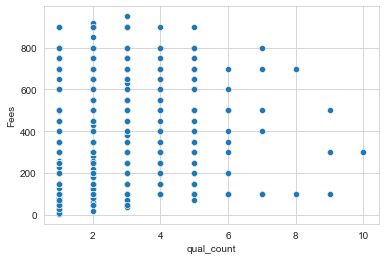

In [867]:
sns.scatterplot(x=train['qual_count'],y=train['Fees'],data=train)

Number of degree does not impact the Fees s shown in the above graph, lets tak first five qualification into different features since the major of doctors have maximum of four qualifications

In [868]:
train.head()

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees,yr_exp,City,Locality,qual_count
0,"BHMS, MD - Homeopathy",24 years experience,100%,"Kakkanad, Ernakulam",Homeopath,"100% 16 Feedback Kakkanad, Ernakulam",100,24,Ernakulam,Kakkanad,2
1,"BAMS, MD - Ayurveda Medicine",12 years experience,98%,"Whitefield, Bangalore",Ayurveda,"98% 76 Feedback Whitefield, Bangalore",350,12,Bangalore,Whitefield,2
2,"MBBS, MS - Otorhinolaryngology",9 years experience,100%,"Mathikere - BEL, Bangalore",ENT Specialist,NaN,300,9,Bangalore,Mathikere - BEL,2
3,"BSc - Zoology, BAMS",12 years experience,100%,"Bannerghatta Road, Bangalore",Ayurveda,"Bannerghatta Road, Bangalore ₹250 Available on...",250,12,Bangalore,Bannerghatta Road,2
4,BAMS,20 years experience,100%,"Keelkattalai, Chennai",Ayurveda,"100% 4 Feedback Keelkattalai, Chennai",250,20,Chennai,Keelkattalai,1


In [869]:
train['Qual_1'] = train['Qualification'].str.split(',').str[0]
train['Qual_2'] = train['Qualification'].str.split(',').str[1]
train['Qual_3'] = train['Qualification'].str.split(',').str[2]
train['Qual_4'] = train['Qualification'].str.split(',').str[3]
train['Qual_5'] = train['Qualification'].str.split(',').str[4]

In [870]:
pd.set_option('display.max_columns', len(train.columns))
train.head()

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees,yr_exp,City,Locality,qual_count,Qual_1,Qual_2,Qual_3,Qual_4,Qual_5
0,"BHMS, MD - Homeopathy",24 years experience,100%,"Kakkanad, Ernakulam",Homeopath,"100% 16 Feedback Kakkanad, Ernakulam",100,24,Ernakulam,Kakkanad,2,BHMS,MD - Homeopathy,NaN,NaN,NaN
1,"BAMS, MD - Ayurveda Medicine",12 years experience,98%,"Whitefield, Bangalore",Ayurveda,"98% 76 Feedback Whitefield, Bangalore",350,12,Bangalore,Whitefield,2,BAMS,MD - Ayurveda Medicine,NaN,NaN,NaN
2,"MBBS, MS - Otorhinolaryngology",9 years experience,100%,"Mathikere - BEL, Bangalore",ENT Specialist,NaN,300,9,Bangalore,Mathikere - BEL,2,MBBS,MS - Otorhinolaryngology,NaN,NaN,NaN
3,"BSc - Zoology, BAMS",12 years experience,100%,"Bannerghatta Road, Bangalore",Ayurveda,"Bannerghatta Road, Bangalore ₹250 Available on...",250,12,Bangalore,Bannerghatta Road,2,BSc - Zoology,BAMS,NaN,NaN,NaN
4,BAMS,20 years experience,100%,"Keelkattalai, Chennai",Ayurveda,"100% 4 Feedback Keelkattalai, Chennai",250,20,Chennai,Keelkattalai,1,BAMS,NaN,NaN,NaN,NaN


lets replace Nan Values from newly created columns with NO.

In [871]:
train['Qual_1'].fillna('No',inplace=True)
train['Qual_2'].fillna('No',inplace=True)
train['Qual_3'].fillna('No',inplace=True)
train['Qual_4'].fillna('No',inplace=True)
train['Qual_5'].fillna('No',inplace=True)

In [872]:
train.isnull().sum()

Qualification            0
Experience               0
Rating                   0
Place                   25
Profile                  0
Miscellaneous_Info    2620
Fees                     0
yr_exp                   0
City                    26
Locality                25
qual_count               0
Qual_1                   0
Qual_2                   0
Qual_3                   0
Qual_4                   0
Qual_5                   0
dtype: int64

miscellaneous feature has nearly 2620 Nan Values, we will drop them in feature engineering. Also most of the miscellanious_info are containing the rating, addreess and price for which we already have diff features, hence dropping this feature

<AxesSubplot:xlabel='yr_exp', ylabel='Fees'>

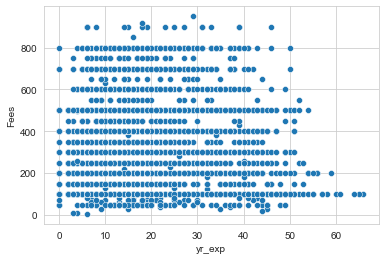

In [873]:
sns.scatterplot(x=train['yr_exp'],y=train['Fees'],data=train)

In [874]:
train[train['yr_exp'] >=60]

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees,yr_exp,City,Locality,qual_count,Qual_1,Qual_2,Qual_3,Qual_4,Qual_5
110,"MRCPS, MBBS",60 years experience,100%,"Old Rajendra Nagar, Delhi",General Medicine,NaN,100,60,Delhi,Old Rajendra Nagar,2,MRCPS,MBBS,No,No,No
372,"MBBS, Diploma in Otorhinolaryngology (DLO)",66 years experience,100%,"Greams Road, Chennai",ENT Specialist,NaN,100,66,Chennai,Greams Road,2,MBBS,Diploma in Otorhinolaryngology (DLO),No,No,No
2062,MBBS,61 years experience,100%,"Goregaon West, Mumbai",General Medicine,NaN,100,61,Mumbai,Goregaon West,1,MBBS,No,No,No,No
5637,"MBBS, MD - General Medicine",65 years experience,100%,"Old Rajendra Nagar, Delhi",General Medicine,NaN,100,65,Delhi,Old Rajendra Nagar,2,MBBS,MD - General Medicine,No,No,No
5807,MBBS,64 years experience,100%,"Ghatkopar East, Mumbai",General Medicine,NaN,100,64,Mumbai,Ghatkopar East,1,MBBS,No,No,No,No


surprisingly 60 yrs of experienced dostors are charging 100 rs as fee

<AxesSubplot:xlabel='Rating', ylabel='Fees'>

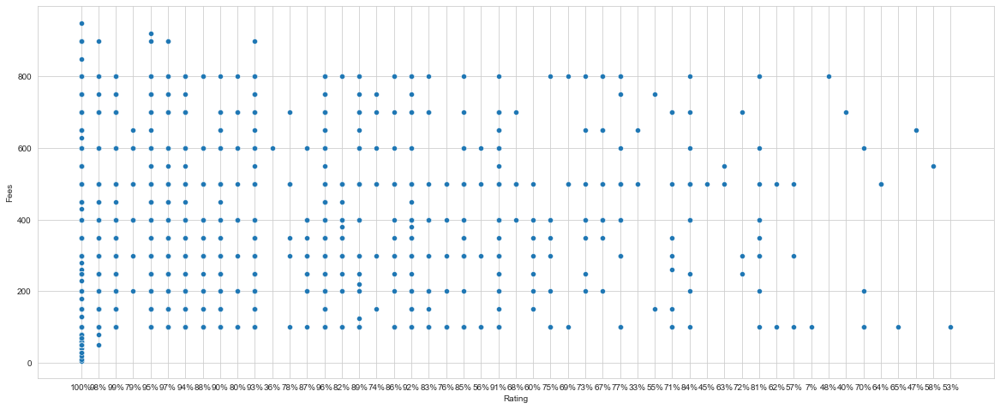

In [875]:
plt.figure(figsize=(20,8))
sns.scatterplot(x=train['Rating'],y=train['Fees'],data=train)

doctors who has rating of more than 77% charging 800 and more as fees

In [876]:
train.columns

Index(['Qualification', 'Experience', 'Rating', 'Place', 'Profile',
       'Miscellaneous_Info', 'Fees', 'yr_exp', 'City', 'Locality',
       'qual_count', 'Qual_1', 'Qual_2', 'Qual_3', 'Qual_4', 'Qual_5'],
      dtype='object')

<AxesSubplot:xlabel='City', ylabel='Fees'>

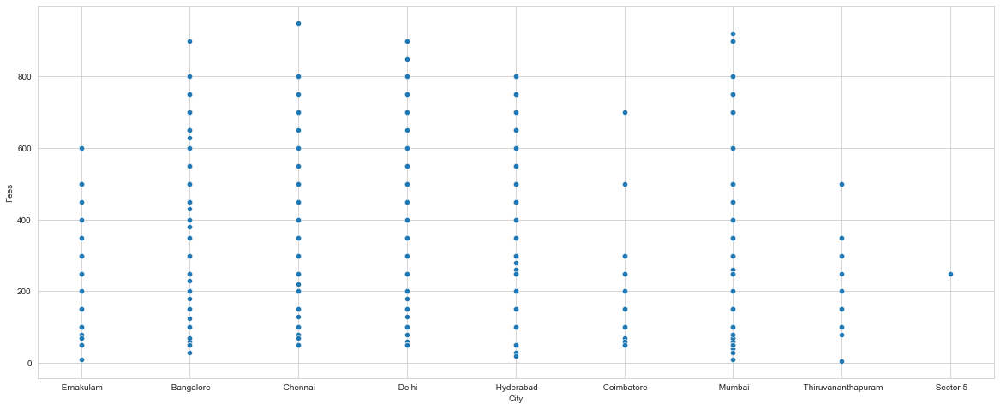

In [877]:
plt.figure(figsize=(20,8))
sns.scatterplot(x=train['City'],y=train['Fees'],data=train)

doctor in chennai charges the most as 950 rs.                            
doctors in Bangalore, Chnneia,Delhi,Mumbai,hyderabad charges 800 and more fees

<AxesSubplot:xlabel='Profile', ylabel='Fees'>

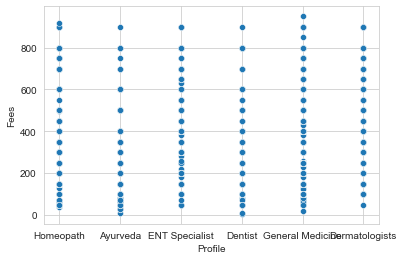

In [878]:
sns.scatterplot(x=train['Profile'],y=train['Fees'],data=train)

Doctors from General medicine group charges the most ,followed by Homepathy

<AxesSubplot:xlabel='Fees', ylabel='Qual_1'>

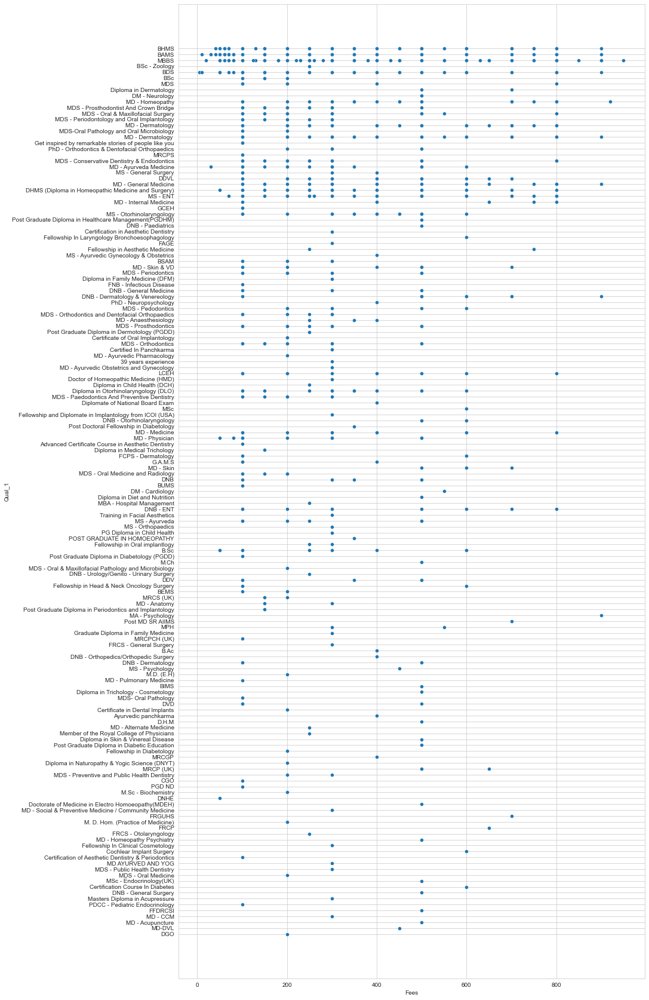

In [879]:
plt.figure(figsize=(14,30))
sns.scatterplot(x=train['Fees'],y=train['Qual_1'],data=train)

doctors whose profile is BHMS, BAMS,MBBS,BDS,MD-Homeopathy,MD-dematology,MD-General Medicine,phd-nueropsycology, post MD SR AIIMS are charging more that 800 rs

# MULTIVARIATE ANALYSIS

<AxesSubplot:>

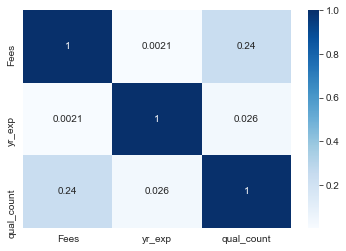

In [880]:
sns.heatmap(train.corr(),annot=True , cmap='Blues')

fees and number of qualifications has less positive correlation wuth Target variable

# FEATURE ENGINEERING

# missing values handling

In [881]:
train.isnull().sum()

Qualification            0
Experience               0
Rating                   0
Place                   25
Profile                  0
Miscellaneous_Info    2620
Fees                     0
yr_exp                   0
City                    26
Locality                25
qual_count               0
Qual_1                   0
Qual_2                   0
Qual_3                   0
Qual_4                   0
Qual_5                   0
dtype: int64

feature place can be dropped since place data has been covered in new features City and Locality                             
Miscellanous information feature has more of missing values and the available info contains rating,place and fees., hence dorppinh it.

In [882]:
df=train.copy()

In [883]:
df.drop('Miscellaneous_Info',axis=1)

,Qualification,Experience,Rating,Place,Profile,Fees,yr_exp,City,Locality,qual_count,Qual_1,Qual_2,Qual_3,Qual_4,Qual_5
0,"BHMS, MD - Homeopathy",24 years experience,100%,"Kakkanad, Ernakulam",Homeopath,100,24,Ernakulam,Kakkanad,2,BHMS,MD - Homeopathy,No,No,No
1,"BAMS, MD - Ayurveda Medicine",12 years experience,98%,"Whitefield, Bangalore",Ayurveda,350,12,Bangalore,Whitefield,2,BAMS,MD - Ayurveda Medicine,No,No,No
2,"MBBS, MS - Otorhinolaryngology",9 years experience,100%,"Mathikere - BEL, Bangalore",ENT Specialist,300,9,Bangalore,Mathikere - BEL,2,MBBS,MS - Otorhinolaryngology,No,No,No
3,"BSc - Zoology, BAMS",12 years experience,100%,"Bannerghatta Road, Bangalore",Ayurveda,250,12,Bangalore,Bannerghatta Road,2,BSc - Zoology,BAMS,No,No,No
4,BAMS,20 years experience,100%,"Keelkattalai, Chennai",Ayurveda,250,20,Chennai,Keelkattalai,1,BAMS,No,No,No,No
5,BAMS,8 years experience,100%,"Porur, Chennai",Ayurveda,100,8,Chennai,Porur,1,BAMS,No,No,No,No
6,BHMS,42 years experience,100%,"Karol Bagh, Delhi",Homeopath,200,42,Delhi,Karol Bagh,1,BHMS,No,No,No,No
7,BDS,10 years experience,99%,"Arekere, Bangalore",Dentist,200,10,Bangalore,Arekere,1,BDS,No,No,No,No
8,"MBBS, MD - General Medicine",14 years experience,100%,"Old City, Hyderabad",General Medicine,100,14,Hyderabad,Old City,2,MBBS,MD - General Medicine,No,No,No
9,"BSc, BDS",23 years experience,100%,"Athani, Ernakulam",Dentist,100,23,Ernakulam,Athani,2,BSc,BDS,No,No,No


In [884]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5961 entries, 0 to 5960
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Qualification       5961 non-null   object
 1   Experience          5961 non-null   object
 2   Rating              5961 non-null   object
 3   Place               5936 non-null   object
 4   Profile             5961 non-null   object
 5   Miscellaneous_Info  3341 non-null   object
 6   Fees                5961 non-null   int64 
 7   yr_exp              5961 non-null   int32 
 8   City                5935 non-null   object
 9   Locality            5936 non-null   object
 10  qual_count          5961 non-null   int64 
 11  Qual_1              5961 non-null   object
 12  Qual_2              5961 non-null   object
 13  Qual_3              5961 non-null   object
 14  Qual_4              5961 non-null   object
 15  Qual_5              5961 non-null   object
dtypes: int32(1), int64(2), o

In [885]:
##replacing missing city values with mode
df['City']=df['City'].replace(np.NaN,df['City'].mode()[0])

In [886]:
##replacing missing locality values with mode

#lets check the city of missing values now to fill the locality
miss_loc=[np.NaN]
Missing_locality=df[df['Locality'].isin(miss_loc)]
Missing_locality

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees,yr_exp,City,Locality,qual_count,Qual_1,Qual_2,Qual_3,Qual_4,Qual_5
91,Get inspired by remarkable stories of people l...,0 years experience,100%,NaN,Dermatologists,NaN,100,0,Bangalore,NaN,1,Get inspired by remarkable stories of people l...,No,No,No,No
502,Get inspired by remarkable stories of people l...,0 years experience,100%,NaN,Dermatologists,NaN,100,0,Bangalore,NaN,1,Get inspired by remarkable stories of people l...,No,No,No,No
599,Get inspired by remarkable stories of people l...,0 years experience,100%,NaN,Dermatologists,NaN,100,0,Bangalore,NaN,1,Get inspired by remarkable stories of people l...,No,No,No,No
605,Get inspired by remarkable stories of people l...,0 years experience,100%,NaN,Dermatologists,NaN,100,0,Bangalore,NaN,1,Get inspired by remarkable stories of people l...,No,No,No,No
724,Get inspired by remarkable stories of people l...,0 years experience,100%,NaN,Dermatologists,NaN,100,0,Bangalore,NaN,1,Get inspired by remarkable stories of people l...,No,No,No,No
1002,Get inspired by remarkable stories of people l...,0 years experience,100%,NaN,Dermatologists,NaN,100,0,Bangalore,NaN,1,Get inspired by remarkable stories of people l...,No,No,No,No
1083,Get inspired by remarkable stories of people l...,0 years experience,100%,NaN,Dermatologists,NaN,100,0,Bangalore,NaN,1,Get inspired by remarkable stories of people l...,No,No,No,No
1210,Get inspired by remarkable stories of people l...,0 years experience,100%,NaN,Dermatologists,NaN,100,0,Bangalore,NaN,1,Get inspired by remarkable stories of people l...,No,No,No,No
2078,Get inspired by remarkable stories of people l...,0 years experience,100%,NaN,Dermatologists,NaN,100,0,Bangalore,NaN,1,Get inspired by remarkable stories of people l...,No,No,No,No
2178,Get inspired by remarkable stories of people l...,0 years experience,100%,NaN,Dermatologists,NaN,100,0,Bangalore,NaN,1,Get inspired by remarkable stories of people l...,No,No,No,No


In [887]:
Missing_locality.City.unique()

array([' Bangalore'], dtype=object)

not the city of missing locality is Bangalor, lets find the mode of locality for Bangalore city and replace the NaN values with the mode

In [888]:
Banaglore_city=df[df['City']==' Bangalore']
Banaglore_city

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees,yr_exp,City,Locality,qual_count,Qual_1,Qual_2,Qual_3,Qual_4,Qual_5
1,"BAMS, MD - Ayurveda Medicine",12 years experience,98%,"Whitefield, Bangalore",Ayurveda,"98% 76 Feedback Whitefield, Bangalore",350,12,Bangalore,Whitefield,2,BAMS,MD - Ayurveda Medicine,No,No,No
2,"MBBS, MS - Otorhinolaryngology",9 years experience,100%,"Mathikere - BEL, Bangalore",ENT Specialist,NaN,300,9,Bangalore,Mathikere - BEL,2,MBBS,MS - Otorhinolaryngology,No,No,No
3,"BSc - Zoology, BAMS",12 years experience,100%,"Bannerghatta Road, Bangalore",Ayurveda,"Bannerghatta Road, Bangalore ₹250 Available on...",250,12,Bangalore,Bannerghatta Road,2,BSc - Zoology,BAMS,No,No,No
7,BDS,10 years experience,99%,"Arekere, Bangalore",Dentist,Dental Fillings Crowns and Bridges Fixing Impa...,200,10,Bangalore,Arekere,1,BDS,No,No,No,No
19,MBBS,19 years experience,100%,"HSR Layout, Bangalore",General Medicine,"100% 4 Feedback HSR Layout, Bangalore",150,19,Bangalore,HSR Layout,1,MBBS,No,No,No,No
26,"MBBS, IBCLC (USA)",25 years experience,100%,"HSR Layout, Bangalore",General Medicine,"100% 46 Feedback HSR Layout, Bangalore",500,25,Bangalore,HSR Layout,2,MBBS,IBCLC (USA),No,No,No
42,"BAMS, Diploma in Emergency Medicine, Diploma i...",31 years experience,100%,"RT Nagar, Bangalore",Ayurveda,"100% 7 Feedback RT Nagar, Bangalore",500,31,Bangalore,RT Nagar,3,BAMS,Diploma in Emergency Medicine,Diploma in Counselling Skills,No,No
55,"MBBS, MS - ENT, MRCS (UK)",25 years experience,36%,"Whitefield, Bangalore",ENT Specialist,"36% 7 Feedback Whitefield, Bangalore",600,25,Bangalore,Whitefield,3,MBBS,MS - ENT,MRCS (UK),No,No
56,BDS,14 years experience,100%,"Yelahanka New Town, Bangalore",Dentist,Teeth - Jewellery Teeth Reshaping Teeth Whitening,200,14,Bangalore,Yelahanka New Town,1,BDS,No,No,No,No
57,"MBBS, MD - Dermatology , Venereology & Leprosy...",11 years experience,97%,"Bannerghatta Road, Bangalore",Dermatologists,"97% 65 Feedback Bannerghatta Road, Bangalore",400,11,Bangalore,Bannerghatta Road,5,MBBS,MD - Dermatology,Venereology & Leprosy,FRGUHS,Fellowship in Dermatological Laser Surgery


In [889]:
ban_loc_mode=Banaglore_city.Locality.mode()

In [890]:
##HDR layout is the mode locality for Bangalor city, lets replace the locality with the mode of locality for bangalore city now

df['Locality']=df['Locality'].replace(np.NaN,ban_loc_mode[0])

In [891]:
df.isnull().sum()

Qualification            0
Experience               0
Rating                   0
Place                   25
Profile                  0
Miscellaneous_Info    2620
Fees                     0
yr_exp                   0
City                     0
Locality                 0
qual_count               0
Qual_1                   0
Qual_2                   0
Qual_3                   0
Qual_4                   0
Qual_5                   0
dtype: int64

In [892]:
#Dropping place,experience,Qualification and mis_info as  discussed above

df.drop('Miscellaneous_Info',axis=1,inplace=True)

In [893]:
df.drop('Place',axis=1,inplace=True)

In [894]:
df.drop('Experience',axis=1,inplace=True)

In [895]:
df.drop('Qualification',axis=1,inplace=True)

In [896]:
df.head()

,Rating,Profile,Fees,yr_exp,City,Locality,qual_count,Qual_1,Qual_2,Qual_3,Qual_4,Qual_5
0,100%,Homeopath,100,24,Ernakulam,Kakkanad,2,BHMS,MD - Homeopathy,No,No,No
1,98%,Ayurveda,350,12,Bangalore,Whitefield,2,BAMS,MD - Ayurveda Medicine,No,No,No
2,100%,ENT Specialist,300,9,Bangalore,Mathikere - BEL,2,MBBS,MS - Otorhinolaryngology,No,No,No
3,100%,Ayurveda,250,12,Bangalore,Bannerghatta Road,2,BSc - Zoology,BAMS,No,No,No
4,100%,Ayurveda,250,20,Chennai,Keelkattalai,1,BAMS,No,No,No,No


In [897]:
df.isnull().sum()

Rating        0
Profile       0
Fees          0
yr_exp        0
City          0
Locality      0
qual_count    0
Qual_1        0
Qual_2        0
Qual_3        0
Qual_4        0
Qual_5        0
dtype: int64

Now the missing values are filled, lets check for the outliers now

Fees             AxesSubplot(0.125,0.125;0.227941x0.755)
yr_exp        AxesSubplot(0.398529,0.125;0.227941x0.755)
qual_count    AxesSubplot(0.672059,0.125;0.227941x0.755)
dtype: object

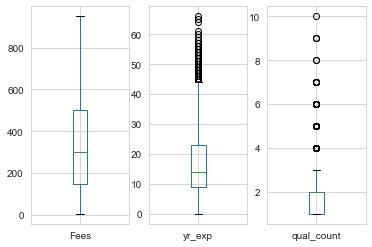

In [898]:
df.plot(kind='box',subplots=True)

there are outliers in features years of experience and qualification count, lets try with Zscore and check data loss

In [899]:
outlier_feature=['yr_exp','qual_count']

In [900]:
#from scipy.stats import zscore

In [901]:
#zscore_feature=[]
#for i in outlier_feature:
    #col=i+'Zscore'
    #df[col]=(df[i]-df[i].mean())/df[i].std()
    #zscore_feature.append(col)

#df

In [902]:
#print('shape before dropping',df.shape)
#for i in zscore_feature:
    #for j in df[i]:
        #if j<3:
            #df_new = df[df[i] < 3]
#print('shape after dropping',df_new.shape)      

In [903]:
#since Zscoree does not remove outliers lets create a dynamic fuction to remove the outliers

def iqrfunction(feature):
    q1=df[feature].quantile(0.25)
    q3=df[feature].quantile(0.75)
    IQR=q3-q1
    print("Q1 is: ",q1)
    print("Q3 is :",q3)
    print("IQR is ",IQR)
    lower_limit=q1-(1.5*IQR)
    higher_limit=q3+(1.5*IQR)
    print("lower range is ",lower_limit)
    print("Higher rnge is ",higher_limit)
    train[feature]=np.where(train[feature]<lower_limit,lower_limit,train[feature])
    train[feature]=np.where(train[feature]>higher_limit,higher_limit,train[feature])
    train[feature].plot.box()

Q1 is:  9.0
Q3 is : 23.0
IQR is  14.0
lower range is  -12.0
Higher rnge is  44.0


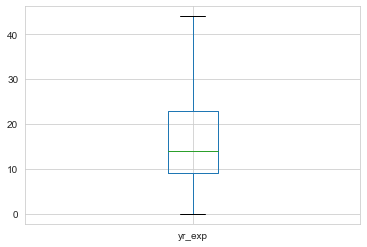

In [904]:
iqrfunction('yr_exp')

Q1 is:  1.0
Q3 is : 2.0
IQR is  1.0
lower range is  -0.5
Higher rnge is  3.5


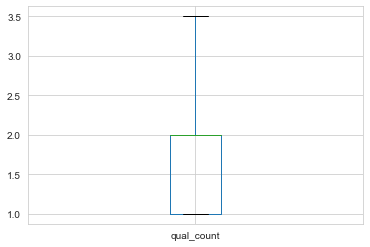

In [905]:
iqrfunction('qual_count')

now the outliers are fixed, lets perform label encoding for the categorical features

Fees             AxesSubplot(0.125,0.125;0.227941x0.755)
yr_exp        AxesSubplot(0.398529,0.125;0.227941x0.755)
qual_count    AxesSubplot(0.672059,0.125;0.227941x0.755)
dtype: object

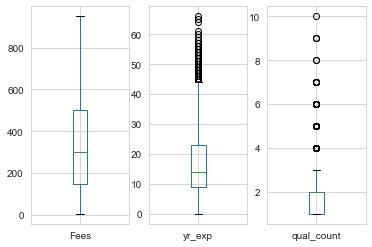

In [906]:
df.plot(kind='box',subplots=True)

now the outliers in all the features ar fixed with the caping of 75 and 25 percentile

In [907]:
#lets check the skewness

df.agg(['skew','kurtosis']).transpose()

,skew,kurtosis
Fees,0.751870,-0.162059
yr_exp,0.991089,0.535196
qual_count,1.433547,4.301957


fees aand years of experience are skews.,  lets perform transformtion techniques to correct them.

did not apply transformation technique to get the the fees as an original amount not as transformed, this alos impacted my prediction. hence revoked the trnsformtion applied in target variable

In [973]:
df['qual_count']=np.log1p(df['qual_count'])
df['qual_count'].skew()

0.10179144576038643

In [909]:
df['yr_exp']=np.sqrt(df['yr_exp'])
df['yr_exp'].skew()

0.08258181262615923

In [910]:
df.agg(['skew','kurtosis']).transpose()

,skew,kurtosis
Fees,0.751870,-0.162059
yr_exp,0.082582,0.111520
qual_count,0.393624,-0.215993


now the skewness are corrected, lets perform ecoding on categorical feature

In [911]:
df.head()

,Rating,Profile,Fees,yr_exp,City,Locality,qual_count,Qual_1,Qual_2,Qual_3,Qual_4,Qual_5
0,100%,Homeopath,100,4.898979,Ernakulam,Kakkanad,1.098612,BHMS,MD - Homeopathy,No,No,No
1,98%,Ayurveda,350,3.464102,Bangalore,Whitefield,1.098612,BAMS,MD - Ayurveda Medicine,No,No,No
2,100%,ENT Specialist,300,3.000000,Bangalore,Mathikere - BEL,1.098612,MBBS,MS - Otorhinolaryngology,No,No,No
3,100%,Ayurveda,250,3.464102,Bangalore,Bannerghatta Road,1.098612,BSc - Zoology,BAMS,No,No,No
4,100%,Ayurveda,250,4.472136,Chennai,Keelkattalai,0.693147,BAMS,No,No,No,No


In [912]:
from sklearn.preprocessing import LabelEncoder

In [913]:
lb_profile = LabelEncoder()
df["Profile"] = lb_profile.fit_transform(df["Profile"])

In [914]:
lb_City = LabelEncoder()
df["City"] = lb_City.fit_transform(df["City"])

In [915]:
lb_Locality = LabelEncoder()
df["Locality"] = lb_Locality.fit_transform(df["Locality"])

In [916]:
lb_qual1 = LabelEncoder()
df["Qual_1"] = lb_qual1.fit_transform(df["Qual_1"])

In [917]:
lb_qual2 = LabelEncoder()
df["Qual_2"] = lb_qual2.fit_transform(df["Qual_2"])

In [918]:
lb_qual3 = LabelEncoder()
df["Qual_3"] = lb_qual3.fit_transform(df["Qual_3"])

In [919]:
lb_qual4 = LabelEncoder()
df["Qual_4"] = lb_qual4.fit_transform(df["Qual_4"])

In [920]:
lb_qual5 = LabelEncoder()
df["Qual_5"] = lb_qual5.fit_transform(df["Qual_5"])

In [921]:
lb_rating = LabelEncoder()
df["Rating"] = lb_rating.fit_transform(df["Rating"])

In [922]:
df.head(50)

,Rating,Profile,Fees,yr_exp,City,Locality,qual_count,Qual_1,Qual_2,Qual_3,Qual_4,Qual_5
0,0,5,100,4.898979,4,296,1.098612,8,252,405,209,95
1,49,0,350,3.464102,0,855,1.098612,5,241,405,209,95
2,0,3,300,3.000000,0,452,1.098612,79,334,405,209,95
3,0,0,250,3.464102,0,68,1.098612,12,7,405,209,95
4,0,0,250,4.472136,1,335,0.693147,5,425,405,209,95
5,0,0,100,2.828427,1,604,0.693147,5,425,405,209,95
6,0,5,200,6.480741,3,324,0.693147,8,425,405,209,95
7,50,1,200,3.162278,0,33,0.693147,6,425,405,209,95
8,0,4,100,3.741657,5,540,1.098612,79,249,405,209,95
9,0,1,100,4.795832,4,39,1.098612,11,8,405,209,95


lest perform standard scaling technique to avoid overfitting

In [923]:
X_normal=df.drop('Fees',axis=1)
Y_normal=df['Fees']
X_normal.head()

,Rating,Profile,yr_exp,City,Locality,qual_count,Qual_1,Qual_2,Qual_3,Qual_4,Qual_5
0,0,5,4.898979,4,296,1.098612,8,252,405,209,95
1,49,0,3.464102,0,855,1.098612,5,241,405,209,95
2,0,3,3.000000,0,452,1.098612,79,334,405,209,95
3,0,0,3.464102,0,68,1.098612,12,7,405,209,95
4,0,0,4.472136,1,335,0.693147,5,425,405,209,95


In [924]:
from sklearn.ensemble import ExtraTreesRegressor

model=ExtraTreesRegressor()
model.fit(X_normal,Y_normal)

ExtraTreesRegressor()

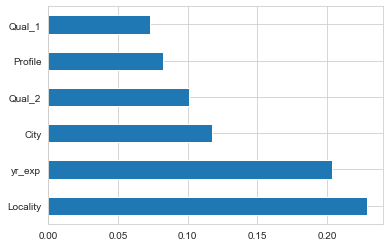

In [925]:
feature_importances= pd.Series(model.feature_importances_,index=X_normal.columns)
feature_importances.nlargest(6).plot(kind='barh')
plt.show()

In [926]:
feature_importances.sort_values()

Qual_5        0.008943
Qual_4        0.015783
Qual_3        0.042301
qual_count    0.055943
Rating        0.071352
Qual_1        0.072569
Profile       0.082425
Qual_2        0.100843
City          0.117643
yr_exp        0.203523
Locality      0.228674
dtype: float64

In [927]:
important_feature=['Locality','yr_exp','City','Qual_2','qual_count','Profile']

In [928]:
final_data=df.copy()

In [929]:
fin=final_data.drop('Rating',axis=1)

In [930]:
final_data.columns

Index(['Rating', 'Profile', 'Fees', 'yr_exp', 'City', 'Locality', 'qual_count',
       'Qual_1', 'Qual_2', 'Qual_3', 'Qual_4', 'Qual_5'],
      dtype='object')

In [931]:
fin1=fin.drop('Qual_1',axis=1)

In [932]:
fin2=fin1.drop('Qual_3',axis=1)

In [933]:
fin3=fin2.drop('Qual_4',axis=1)

In [934]:
fin4=fin3.drop('Qual_5',axis=1)

In [935]:
x=fin4.drop('Fees',axis=1)

In [936]:
x.head()

,Profile,yr_exp,City,Locality,qual_count,Qual_2
0,5,4.898979,4,296,1.098612,252
1,0,3.464102,0,855,1.098612,241
2,3,3.000000,0,452,1.098612,334
3,0,3.464102,0,68,1.098612,7
4,0,4.472136,1,335,0.693147,425


In [937]:
y=df['Fees']

In [938]:
y.head()

0    100
1    350
2    300
3    250
4    250
Name: Fees, dtype: int64

In [939]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,Profile,yr_exp,City,Locality,qual_count,Qual_2
0,1.543016,0.712645,0.404084,-0.447261,0.161751,-0.272022
1,-1.472893,-0.345427,-1.314912,1.743577,0.161751,-0.355728
2,0.336652,-0.687654,-1.314912,0.164135,0.161751,0.351974
3,-1.472893,-0.345427,-1.314912,-1.340841,0.161751,-2.136398
4,-1.472893,0.397893,-0.885163,-0.294412,-1.199060,1.044457
5,-1.472893,-0.814171,-0.885163,0.759855,-1.199060,1.044457
6,1.543016,1.879029,-0.025665,-0.337523,-1.199060,1.044457
7,-0.869711,-0.567991,-1.314912,-1.478014,-1.199060,1.044457
8,0.939834,-0.140759,0.833832,0.509026,0.161751,-0.294851
9,-0.869711,0.636584,0.404084,-1.454498,0.161751,-2.128788


# MODEL SELECTION AND TRAIN TEST SPLIT

In [940]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error

In [941]:
best_score=0
best_random_state=0

for i in range (0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.22,random_state=i)
    LR=LinearRegression()
    LR.fit(x_train,y_train)
    LR_pred=LR.predict(x_test)
    r2score=r2_score(y_test,LR_pred)
    if r2score>best_score:
        best_score=r2score
        best_random_state=i
print('Best score is : {}, at randome state {}'.format(best_score,best_random_state))

Best score is : 0.11098276481625902, at randome state 12


In [942]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.22,random_state=74)

# LINEAR REGRESSION

In [943]:
LR=LinearRegression()
LR.fit(x_train,y_train)
LR_pred=LR.predict(x_test)
r2score=r2_score(y_test,LR_pred)

print('R2score is : ',r2score)
print('')
print('Errors:')

print('mean Absolute error: ', mean_absolute_error(y_test, LR_pred))
print('Mean squared error: ', mean_squared_error(y_test,LR_pred))
print('Root mean squared error: ', np.sqrt(mean_squared_error(y_test,LR_pred)))


R2score is :  0.1080139584976414

Errors:
mean Absolute error:  149.68188706379402
Mean squared error:  33618.19182053127
Root mean squared error:  183.35264334208892


Accuracy of liner regression is 14%, lets try with few more models to find the best model for this problem statement

In [944]:
!pip install xgboost

In [945]:
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
import xgboost as xg

In [946]:
XG = xg.XGBRegressor(n_estimators = 5)
XG.fit(x_train,y_train)
xg_pred=XG.predict(x_test)
r2score=r2_score(y_test,xg_pred)

print('R2score is : ',r2score)
print('')
print('Errors:')

print('mean Absolute error: ', mean_absolute_error(y_test, xg_pred))
print('Mean squared error: ', mean_squared_error(y_test,xg_pred))
print('Root mean squared error: ', np.sqrt(mean_squared_error(y_test,xg_pred)))

R2score is :  0.11167692830703813

Errors:
mean Absolute error:  137.9881174593437
Mean squared error:  33480.13761793668
Root mean squared error:  182.97578423916286


In [947]:
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor

In [948]:
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)
RFR_pred=RFR.predict(x_test)

r2score=r2_score(y_test,RFR_pred)

print('R2score is : ',r2score)
print('')
print('Errors:')

print('mean Absolute error: ', mean_absolute_error(y_test, RFR_pred))
print('Mean squared error: ', mean_squared_error(y_test,RFR_pred))
print('Root mean squared error: ', np.sqrt(mean_squared_error(y_test,RFR_pred)))

R2score is :  0.20599153781691204

Errors:
mean Absolute error:  133.5212487296748
Mean squared error:  29925.5005648264
Root mean squared error:  172.98988572984953


In [949]:
ADA=AdaBoostRegressor()
ADA.fit(x_train,y_train)
ADA_pred=ADA.predict(x_test)

r2score=r2_score(y_test,ADA_pred)

print('R2score is : ',r2score)
print('')
print('Errors:')

print('mean Absolute error: ', mean_absolute_error(y_test, ADA_pred))
print('Mean squared error: ', mean_squared_error(y_test,ADA_pred))
print('Root mean squared error: ', np.sqrt(mean_squared_error(y_test,ADA_pred)))

R2score is :  0.1352428056940017

Errors:
mean Absolute error:  150.1204092209044
Mean squared error:  32591.9598331367
Root mean squared error:  180.53243429682297


In [950]:
from sklearn.neighbors import KNeighborsRegressor

In [951]:
KNN=KNeighborsRegressor(n_neighbors=2)
KNN.fit(x_train,y_train)
KNN_pred=KNN.predict(x_test)
r2score=r2_score(y_test,KNN_pred)

print('R2score is : ',r2score)
print('')
print('Errors:')

print('mean Absolute error: ', mean_absolute_error(y_test, KNN_pred))
print('Mean squared error: ', mean_squared_error(y_test,KNN_pred))
print('Root mean squared error: ', np.sqrt(mean_squared_error(y_test,KNN_pred)))

R2score is :  -0.17868061917833233

Errors:
mean Absolute error:  157.90205792682926
Mean squared error:  44423.46551067073
Root mean squared error:  210.76874889477978


<AxesSubplot:ylabel='Fees'>

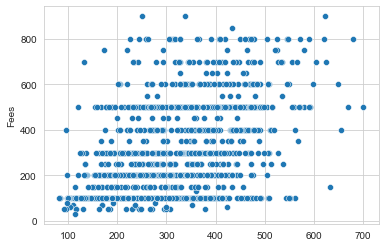

In [952]:
sns.scatterplot(x=RFR_pred, y=y_test)

RFR boost regreessor gives me the better r2_score, lets predict the fees for test data

In [953]:
test=pd.read_excel('Final_Test.xlsx')
test.head()

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info
0,MBBS,35 years experience,NaN,"Ghatkopar East, Mumbai",General Medicine,NaN
1,"MBBS, Diploma in Otorhinolaryngology (DLO)",31 years experience,NaN,"West Marredpally, Hyderabad",ENT Specialist,NaN
2,"MBBS, DDVL",40 years experience,70%,"KK Nagar, Chennai",Dermatologists,"70% 4 Feedback KK Nagar, Chennai"
3,BAMS,0 years experience,NaN,"New Ashok Nagar, Delhi",Ayurveda,NaN
4,"BDS, MDS - Conservative Dentistry & Endodontics",16 years experience,100%,"Kanakpura Road, Bangalore",Dentist,General Dentistry Conservative Dentistry Cosme...


In [954]:
#creating a new column with number of yrs of experience

yr_exp=[]
for i in test['Experience']:
    yr_exp_spl=i.split(' ')
    yr_exp.append(yr_exp_spl[0])

test['yr_exp']=yr_exp

In [955]:
test.head(50)

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,yr_exp
0,MBBS,35 years experience,NaN,"Ghatkopar East, Mumbai",General Medicine,NaN,35
1,"MBBS, Diploma in Otorhinolaryngology (DLO)",31 years experience,NaN,"West Marredpally, Hyderabad",ENT Specialist,NaN,31
2,"MBBS, DDVL",40 years experience,70%,"KK Nagar, Chennai",Dermatologists,"70% 4 Feedback KK Nagar, Chennai",40
3,BAMS,0 years experience,NaN,"New Ashok Nagar, Delhi",Ayurveda,NaN,0
4,"BDS, MDS - Conservative Dentistry & Endodontics",16 years experience,100%,"Kanakpura Road, Bangalore",Dentist,General Dentistry Conservative Dentistry Cosme...,16
5,"BDS, MDS",14 years experience,90%,"Velachery, Chennai",Dentist,Acrylic Partial Denture Impaction / Impacted T...,14
6,"MBBS, Diploma in Otorhinolaryngology (DLO)",23 years experience,94%,"Frazer Town, Bangalore",ENT Specialist,"94% 6 Feedback Frazer Town, Bangalore",23
7,"BDS, MDS - Pedodontics",9 years experience,94%,"Attapur, Hyderabad",Dentist,RCT - Root Canal Treatment Ceramic Veneers / C...,9
8,"MD - Ayurveda Medicine, BAMS, Yoga Teachers Tr...",11 years experience,99%,"Banashankari, Bangalore",Ayurveda,"99% 203 Feedback Banashankari, Bangalore",11
9,BHMS,44 years experience,NaN,"Mayur Vihar Ph-I, Delhi",Homeopath,NaN,44


In [956]:
test['Qual_1'] = test['Qualification'].str.split(',').str[0]
test['Qual_2'] = test['Qualification'].str.split(',').str[1]
test['Qual_3'] = test['Qualification'].str.split(',').str[2]
test['Qual_4'] = test['Qualification'].str.split(',').str[3]
test['Qual_5'] = test['Qualification'].str.split(',').str[4]

In [957]:
test.head()

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,yr_exp,Qual_1,Qual_2,Qual_3,Qual_4,Qual_5
0,MBBS,35 years experience,NaN,"Ghatkopar East, Mumbai",General Medicine,NaN,35,MBBS,NaN,NaN,NaN,NaN
1,"MBBS, Diploma in Otorhinolaryngology (DLO)",31 years experience,NaN,"West Marredpally, Hyderabad",ENT Specialist,NaN,31,MBBS,Diploma in Otorhinolaryngology (DLO),NaN,NaN,NaN
2,"MBBS, DDVL",40 years experience,70%,"KK Nagar, Chennai",Dermatologists,"70% 4 Feedback KK Nagar, Chennai",40,MBBS,DDVL,NaN,NaN,NaN
3,BAMS,0 years experience,NaN,"New Ashok Nagar, Delhi",Ayurveda,NaN,0,BAMS,NaN,NaN,NaN,NaN
4,"BDS, MDS - Conservative Dentistry & Endodontics",16 years experience,100%,"Kanakpura Road, Bangalore",Dentist,General Dentistry Conservative Dentistry Cosme...,16,BDS,MDS - Conservative Dentistry & Endodontics,NaN,NaN,NaN


In [958]:
test['City'] = list(test['Place'].str.split(',').str[1])
test['Locality'] = list(test['Place'].str.split(',').str[0])

In [959]:
length=[]
for i in test['Qualification']:
    qual_split=i.split(',')
    length.append(len(qual_split))

test['qual_count']=length

In [960]:
test.head()

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,yr_exp,Qual_1,Qual_2,Qual_3,Qual_4,Qual_5,City,Locality,qual_count
0,MBBS,35 years experience,NaN,"Ghatkopar East, Mumbai",General Medicine,NaN,35,MBBS,NaN,NaN,NaN,NaN,Mumbai,Ghatkopar East,1
1,"MBBS, Diploma in Otorhinolaryngology (DLO)",31 years experience,NaN,"West Marredpally, Hyderabad",ENT Specialist,NaN,31,MBBS,Diploma in Otorhinolaryngology (DLO),NaN,NaN,NaN,Hyderabad,West Marredpally,2
2,"MBBS, DDVL",40 years experience,70%,"KK Nagar, Chennai",Dermatologists,"70% 4 Feedback KK Nagar, Chennai",40,MBBS,DDVL,NaN,NaN,NaN,Chennai,KK Nagar,2
3,BAMS,0 years experience,NaN,"New Ashok Nagar, Delhi",Ayurveda,NaN,0,BAMS,NaN,NaN,NaN,NaN,Delhi,New Ashok Nagar,1
4,"BDS, MDS - Conservative Dentistry & Endodontics",16 years experience,100%,"Kanakpura Road, Bangalore",Dentist,General Dentistry Conservative Dentistry Cosme...,16,BDS,MDS - Conservative Dentistry & Endodontics,NaN,NaN,NaN,Bangalore,Kanakpura Road,2


In [961]:
lb_profile = LabelEncoder()
test["Locality"] = lb_profile.fit_transform(test["Locality"])

In [962]:
important_feature

['Locality', 'yr_exp', 'City', 'Qual_2', 'qual_count', 'Profile']

In [963]:
lb_profile = LabelEncoder()
test["yr_exp"] = lb_profile.fit_transform(test["yr_exp"])

In [964]:
lb_profile = LabelEncoder()
test["City"] = lb_profile.fit_transform(test["City"])

In [965]:
lb_profile = LabelEncoder()
test["Qual_2"] = lb_profile.fit_transform(test["Qual_2"])

In [966]:
lb_profile = LabelEncoder()
test["Profile"] = lb_profile.fit_transform(test["Profile"])

In [967]:
t1=test.drop('Qualification',axis=1)
t2=t1.drop('Experience',axis=1)
t3=t2.drop('Rating',axis=1)
t4=t3.drop('Place',axis=1)
t5=t4.drop('Miscellaneous_Info',axis=1)
t6=t5.drop('Qual_1',axis=1)
t7=t6.drop('Qual_3',axis=1)
t8=t7.drop('Qual_4',axis=1)
final_test=t8.drop('Qual_5',axis=1)
final_test

,Profile,yr_exp,Qual_2,City,Locality,qual_count
0,4,28,243,6,142,1
1,3,24,79,5,577,2
2,2,34,28,1,212,2
3,0,0,243,3,373,1
4,1,7,157,0,231,2
5,1,5,156,1,552,2
6,3,15,79,0,134,2
7,1,56,167,5,31,2
8,0,2,4,0,48,4
9,5,38,243,3,323,1


In [968]:
RFR_pred=RFR.predict(final_test)

In [969]:
final_test['Predicted Fees']=list(RFR_pred)

In [970]:
final_test

,Profile,yr_exp,Qual_2,City,Locality,qual_count,Predicted Fees
0,4,28,243,6,142,1,374.0
1,3,24,79,5,577,2,377.5
2,2,34,28,1,212,2,344.5
3,0,0,243,3,373,1,295.5
4,1,7,157,0,231,2,361.0
5,1,5,156,1,552,2,307.0
6,3,15,79,0,134,2,374.0
7,1,56,167,5,31,2,340.5
8,0,2,4,0,48,4,365.2
9,5,38,243,3,323,1,374.0


In [972]:
final_test.to_csv('predicted_doctor_fees')